In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#TO check GPU usage
#!nvidia-smi

In [1]:
!unzip "drive/My Drive/Colab Notebooks/Dog Project/dog-breed-identification.zip" -d "drive/My Drive/Colab Notebooks/Dog Project"

unzip:  cannot find or open drive/My Drive/Colab Notebooks/Dog Project/dog-breed-identification.zip, drive/My Drive/Colab Notebooks/Dog Project/dog-breed-identification.zip.zip or drive/My Drive/Colab Notebooks/Dog Project/dog-breed-identification.zip.ZIP.


End-to-End Dog Vision Project

## 1. Problem
 Identify the breed of a dog given the image of a dog.

## 2. Data
The data is taken from Kaggle.com

## 3. Evaluation
The evaluation is a file with prediciton possibilites for each dog breed of a test image.

## 4. Features
Some information about the data:
* We're dealing with unstructured data so it's best to use deep learning/transfer learning.
* There are 120 breeds of dog in the given data, which means there are 120 classes.
* There are 10,000+ images in the training set. Each image has a label.
* There are around 10,000 images in the test set. These images have no labels because we have to predict them.

In [ ]:
##Importing Tensorflow 2
import tensorflow as tf
import tensorflow_hub as hub
print("TF version: ", tf.__version__)
print("TF Hub version: ", hub.__version__)

print("GPU available" if tf.config.list_physical_devices("GPU") else "not available")

TF version:  2.15.0
TF Hub version:  0.16.1
GPU available


With all machine learning models, our data has to be in numerical format. Hence, step one is to convert the images into tensors (numerical representation).

Let's start by accessing the labels.

In [ ]:
import pandas as pd

labels_csv = pd.read_csv("drive/My Drive/Colab Notebooks/Dog Project/labels.csv")

print(labels_csv.describe())
print(labels_csv.tail())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126
                                     id                     breed
10217  ffd25009d635cfd16e793503ac5edef0                    borzoi
10218  ffd3f636f7f379c51ba3648a9ff8254f            dandie_dinmont
10219  ffe2ca6c940cddfee68fa3cc6c63213f                  airedale
10220  ffe5f6d8e2bff356e9482a80a6e29aac        miniature_pinscher
10221  fff43b07992508bc822f33d8ffd902ae  chesapeake_bay_retriever


<Axes: xlabel='breed'>

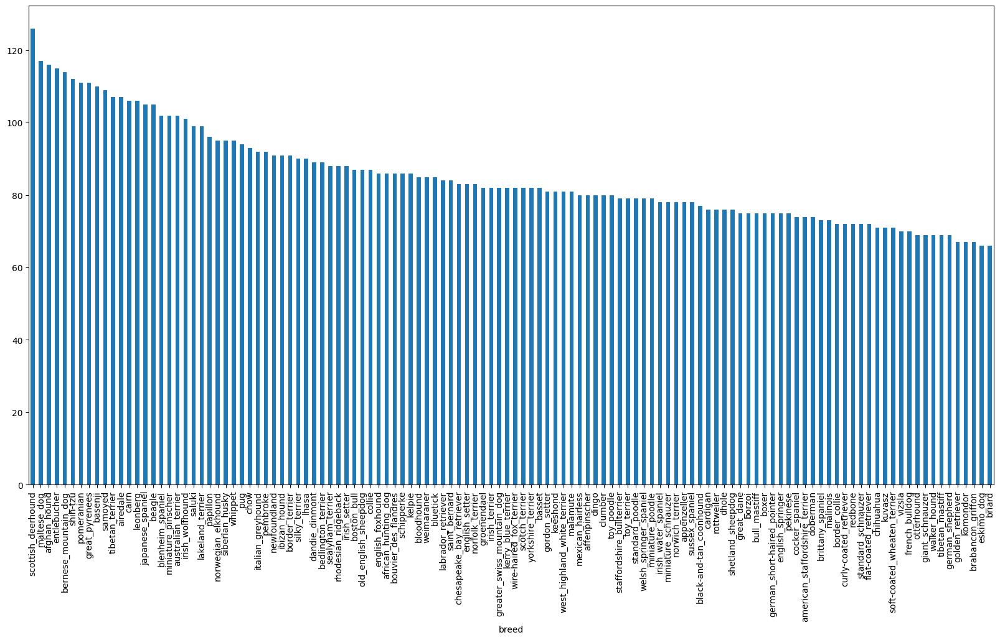

In [ ]:
##How many images are there of each breed?
labels_csv['breed'].value_counts().plot.bar(figsize=(20, 10))

In [ ]:
labels_csv['breed'].value_counts().median()

82.0

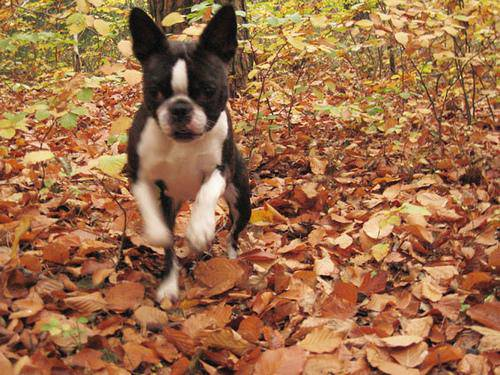

In [ ]:
##How to load an Image
from IPython.display import Image
Image("drive/My Drive/Colab Notebooks/Dog Project/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

In [ ]:
#Create pathname for Image ID's
filename = ['drive/My Drive/Colab Notebooks/Dog Project/train/' + fname + '.jpg' for fname in labels_csv['id']]
print(filename)

['drive/My Drive/Colab Notebooks/Dog Project/train/000bec180eb18c7604dcecc8fe0dba07.jpg', 'drive/My Drive/Colab Notebooks/Dog Project/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg', 'drive/My Drive/Colab Notebooks/Dog Project/train/001cdf01b096e06d78e9e5112d419397.jpg', 'drive/My Drive/Colab Notebooks/Dog Project/train/00214f311d5d2247d5dfe4fe24b2303d.jpg', 'drive/My Drive/Colab Notebooks/Dog Project/train/0021f9ceb3235effd7fcde7f7538ed62.jpg', 'drive/My Drive/Colab Notebooks/Dog Project/train/002211c81b498ef88e1b40b9abf84e1d.jpg', 'drive/My Drive/Colab Notebooks/Dog Project/train/00290d3e1fdd27226ba27a8ce248ce85.jpg', 'drive/My Drive/Colab Notebooks/Dog Project/train/002a283a315af96eaea0e28e7163b21b.jpg', 'drive/My Drive/Colab Notebooks/Dog Project/train/003df8b8a8b05244b1d920bb6cf451f9.jpg', 'drive/My Drive/Colab Notebooks/Dog Project/train/0042188c895a2f14ef64a918ed9c7b64.jpg', 'drive/My Drive/Colab Notebooks/Dog Project/train/004396df1acd0f1247b740ca2b14616e.jpg', 'drive/My Drive/Cola

In [ ]:
##Check whether the number of filenames matches the number of actual Image files.
import os
if len(os.listdir('drive/My Drive/Colab Notebooks/Dog Project/train/')) == len(filename):
  print("Yes, they match.")
else:
  print("No!")

Yes, they match.


In [ ]:
print(len(filename))
print(len(os.listdir('drive/My Drive/Colab Notebooks/Dog Project/train')))

10222
10222


In [ ]:
##Turning data labels into numbers
import numpy as np
labels = labels_csv['breed'].to_numpy()
#label = np.array(labels) # does the same as above code
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
#Check if the number of labels matches the number of filenames
len(labels) == len(filename)

True

In [ ]:
#Find the unique breeds
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
#Turn a single label into a boolean array
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
#Turn every single label into boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
#Turning the boolean array into integers
print(labels[0])
print(np.where(labels[0] == unique_breeds)) #index where label occurs
print(boolean_labels[0].argmax()) #index in the boolean array where label occurs
print(boolean_labels[0].astype(int)) #There will be a 1 in the array

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
#Setup X and y variables
X = filename
y = boolean_labels



We're going to experiment starting with ~1000 images and increase if necessary.

In [ ]:
#Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param{type:"slider", min:1000, max:10000, step:1000}

In [ ]:
#Splitting our data into train and validation sets
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES], y[:NUM_IMAGES], test_size=0.2, random_state=42)

len(X_train), len(X_val), len(y_train), len(y_val)

(800, 200, 800, 200)

In [ ]:
X_train[:5], y_train[:2]

(['drive/My Drive/Colab Notebooks/Dog Project/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/My Drive/Colab Notebooks/Dog Project/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/My Drive/Colab Notebooks/Dog Project/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/My Drive/Colab Notebooks/Dog Project/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/My Drive/Colab Notebooks/Dog Project/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, Fal

##Preprocessing Images (turning Images into Tensors)

To preprocess our images into Tensors, we need a function that does the following:
* Take an image file path as input
* Use Tensorflow to read the file and save it to a variable, image
* Turn the image (a jpg) into a Tensor
* Resize the shape of the image to (224, 224)
* Return the modified image

In [ ]:
#Before we do that, let's see what importing an image looks like.
#Converting the image into a np array
from matplotlib.pyplot import imread
image = imread(filename[42])
image.shape

(257, 350, 3)

In [ ]:
#Converting the image into a Tensor
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  5

In [ ]:
#Now let's define the function

#SETTING Image Size to 224 for later use in our deep learning model. Each model demands a specific size of image.
IMG_SIZE = 224

def process_image(image_path, img_size=IMG_SIZE):
  """
  Converts an Image to a Tensor.
  """

  #Read in an image file
  image = tf.io.read_file(image_path)
  #Convert the image into a numerical tensor with 3 color channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  #Convert the color channel values from 0-255 to 0-1
  image = tf.image.convert_image_dtype(image, tf.float32)
  #Resize the image to our desired value
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

###Turning our Data into batches.
This process is important when processing 10,000+ images because they all might not fit into memory.
So that's why we do 32 images at one time (this is the batch size).

To use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this:
`(image, label)`

In [ ]:
#Create a simple function to return Tensor tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label, processes the image and returns a type of tuple (image, label).
  """
  image = process_image(image_path)
  return image, label


In [ ]:
process_image(X[42], tf.constant(y[42]))

<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
array([[[0.3264178 , 0.5222886 , 0.3232816 ],
        [0.2537167 , 0.44366494, 0.24117757],
        [0.25699762, 0.4467087 , 0.23893751],
        ...,
        [0.29325107, 0.5189916 , 0.3215547 ],
        [0.29721776, 0.52466875, 0.33030328],
        [0.2948505 , 0.5223015 , 0.33406618]],

       [[0.25903144, 0.4537807 , 0.27294815],
        [0.24375686, 0.4407019 , 0.2554778 ],
        [0.2838985 , 0.47213382, 0.28298813],
        ...,
        [0.2785345 , 0.5027992 , 0.31004712],
        [0.28428748, 0.5108719 , 0.32523635],
        [0.28821915, 0.5148036 , 0.32916805]],

       [[0.20941195, 0.40692952, 0.25792548],
        [0.24045378, 0.43900946, 0.2868911 ],
        [0.29001117, 0.47937486, 0.32247734],
        ...,
        [0.26074055, 0.48414773, 0.30125174],
        [0.27101526, 0.49454468, 0.32096273],
        [0.27939945, 0.5029289 , 0.32934693]],

       ...,

       [[0.00634795, 0.03442048, 0.0258106 ],
        [0.01

Now we've figured out a way to convert our data into Tensor tuples (image, label). Let's make a function to turn our data into batches.

In [ ]:
#Define a batch size, 32 is a good size.
BATCH_SIZE = 32

#Create a function to turn data into batches.
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of images (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't if it's validation data.
  Also accepts test data as input (no labels).
  """

  #If the data is test dataset, we probably don't have any labels.
  if test_data:
    print("Creating test batches...")
    data = tf.data.Dataset.from_tensor_slices(tf.constant(X))
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  elif valid_data:
    print("Creating Validation batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))

    #Shuffling the data before applying image processor is faster than the other way.
    data = data.shuffle(buffer_size=len(X))

    #Create (image, label) tuples (this also turns the image path into a preprocessed image).
    data = data.map(get_image_label)

    #Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch


In [ ]:
#Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training batches...
Creating Validation batches...


In [ ]:
#Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [ ]:
##Visualizing our data
import matplotlib.pyplot as plt

def show_25_images(images, labels):
  """
  Displays a plot of 25 images with their labels from a data batch.
  """

  plt.figure(figsize=(10, 10))
  #Loop through 25 to display 25 images
  for i in range(25):
    #Create subplot, 5 rows and 5 columns
    ax = plt.subplot(5, 5, i+1)
    #Display an image
    plt.imshow(images[i])
    #Display the label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    #Hide the axis line
    plt.axis("off")

In [ ]:
unique_breeds[y[0].argmax()]

'boston_bull'

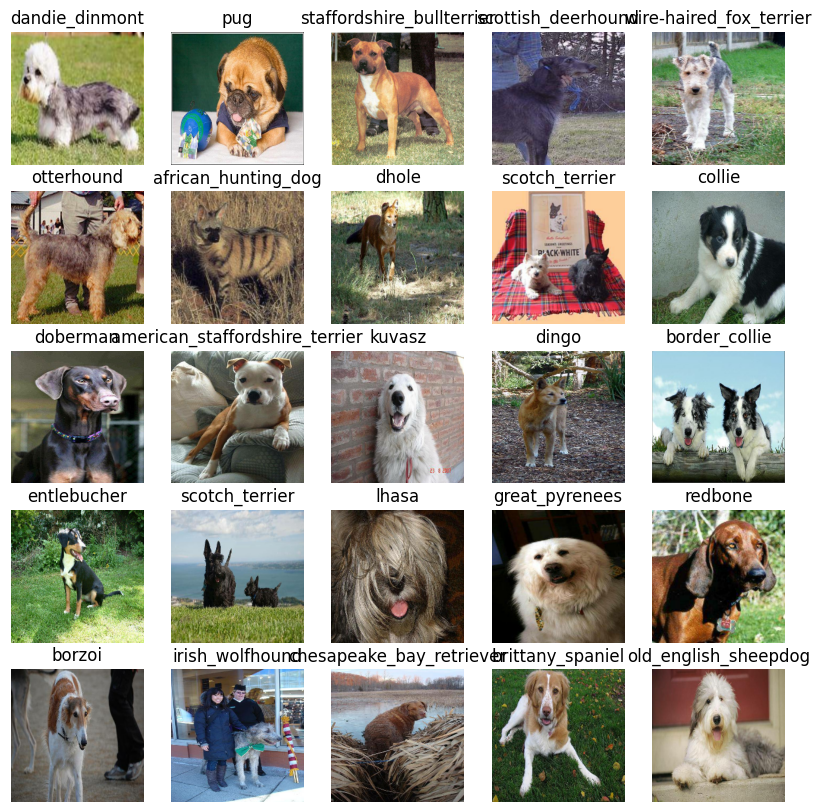

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

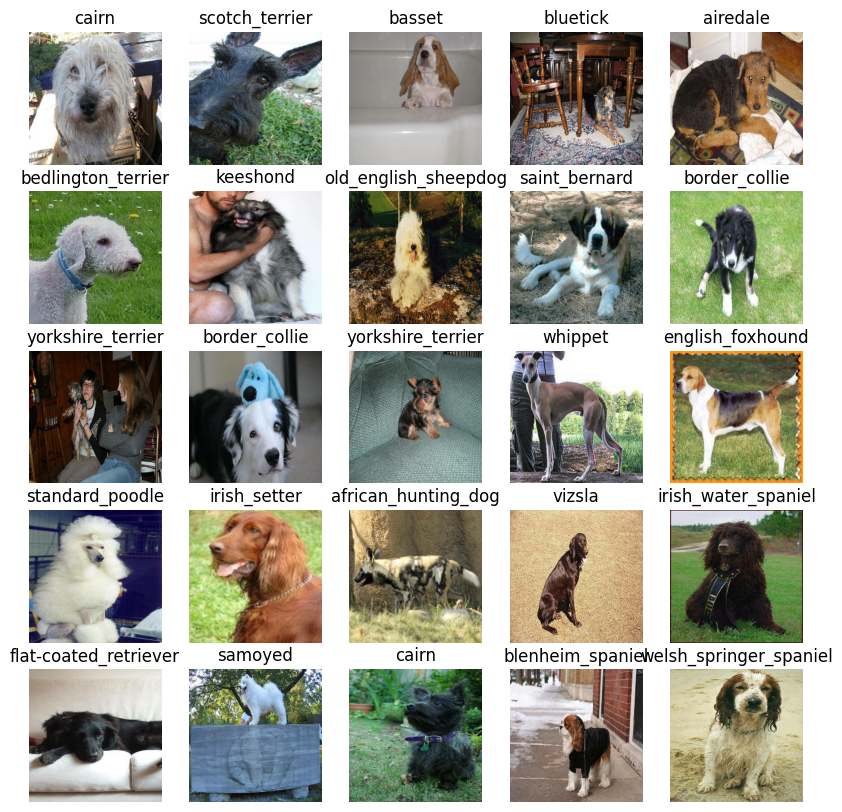

In [ ]:
#Doing the same as above for validation sets
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

##Building a Model

Before building a model, the following things are required:
1. The input shape (turning our images into Tensors)
2. The output shape (turning our image labels into Tensors)
3. The URL of the model we want to use.

In [ ]:
#Setup input shape of the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]

#Setup output shape of the model
OUTPUT_SHAPE = len(unique_breeds)

MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

Now we've got our input, output shape, and model URL. Let's put them together in the Keras deep learning model.

Knowing this, let's create a function which:
1. Takes the input shape, output shape, and model as parameters.
2. Defines the layers in Keras model in a sequential fashion.
3. Compiles the model (says it should be evaluated and improved)
4. Builds the model (tells the model the input shape it'll be getting)
5. Returns the model.

In [ ]:
#Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building a model with: ", MODEL_URL)

  #Setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), #Layer 1 (input_shape)
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                             activation="softmax") #Layer 2, output layer
  ])

  #Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["Accuracy"]
  )

  #Build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()

Building a model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


##Creating callbacks

Callbacks are helper functions that a model can use during its training to save its progress, check its progress, or stop from overfitting.

We'll create two callbacks, one for Tensorboard which keeps track of the model's progress, and the other to prevent the model from training too long.

###Tensor Callback
To create a tensor callback, three things are required:
1. Load the TensorBoard notebook extension
2. Create a Tensorboard callback which is able to save logs to our directory and pass it to the model's `fit()` function.
3. Visualize our model's training logs by using Tensorboard's magic function.

In [ ]:
#Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

#Create a function to build a tensorboard callback
def create_tensorboard_callback():
  #Create a log directory for storing tensorboard callbacks
  logdir = os.path.join("drive/My Drive/Colab Notebooks/Dog Project/logs",
                        #Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("Y%m%d-%H%M%S")
                        )
  return tf.keras.callbacks.TensorBoard(logdir)



In [ ]:
#Creating an Early Stopping Callback to prevent the model from overfitting.
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=3)


##Training a model (on subset of data)

Our first model is only going to train on 1000 images to make sure everything is working.

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

Let's create a function which trains the model.

* Create a model using create_model().
* Setup a tensorboard callback using create_tensorboard_callback()
* Call the `fit()` function in our model passing it the training data, validation data, and number of epochs.
* Return the model.

In [ ]:
#Build a function to train and return the trained model
def train_model():
  """
  Trains a given model and returns the trained model.
  """

  #Create a model
  model = create_model()

  #Create a callback
  tensorboard = create_tensorboard_callback()

  #Fit the model with the given data and callbacks
  model.fit(x=train_data, epochs=NUM_EPOCHS, validation_data=val_data, validation_freq=1, callbacks=[tensorboard, early_stopping])

  #Return the fitted model
  return model

In [ ]:
#Train the model
model = train_model()

Building a model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - ETA: 0s - loss: 4.5751 - Accuracy: 0.1025

25/25 [==============================] - 145s 4s/step - loss: 4.5751 - Accuracy: 0.1025 - val_loss: 3.5423 - val_Accuracy: 0.2750
Epoch 2/100
25/25 [==============================] - ETA: 0s - loss: 1.6324 - Accuracy: 0.6925

25/25 [==============================] - 4s 169ms/step - loss: 1.6324 - Accuracy: 0.6925 - val_loss: 2.2521 - val_Accuracy: 0.4700
Epoch 3/100
25/25 [==============================] - ETA: 0s - loss: 0.5675 - Accuracy: 0.9413

25/25 [==============================] - 6s 220ms/step - loss: 0.5675 - Accuracy: 0.9413 - val_loss: 1.7700 - val_Accuracy: 0.5700
Epoch 4/100
25/25 [==============================] - ETA: 0s - loss: 0.2506 - Accuracy: 0.9825

25/25 [==============================] - 4s 174ms/step - loss: 0.2506 - Accuracy: 0.9825 - val_loss: 1.5797 - val_Accuracy: 0.6100
Epoch 5/100
25/25 [==============================] - ETA: 0s - loss: 0.1449 - Accuracy: 0.9975

25/25 [==============================] - 4s 164ms/step - loss: 0.1449 - Accuracy: 0.9975 - val_loss: 1.4845 - val_Accuracy: 0.6400
Epoch 6/100
25/25 [==============================] - ETA: 0s - loss: 0.1001 - Accuracy: 1.0000

25/25 [==============================] - 5s 179ms/step - loss: 0.1001 - Accuracy: 1.0000 - val_loss: 1.4486 - val_Accuracy: 0.6350
Epoch 7/100
25/25 [==============================] - ETA: 0s - loss: 0.0752 - Accuracy: 1.0000

25/25 [==============================] - 4s 180ms/step - loss: 0.0752 - Accuracy: 1.0000 - val_loss: 1.4108 - val_Accuracy: 0.6600
Epoch 8/100
25/25 [==============================] - ETA: 0s - loss: 0.0599 - Accuracy: 1.0000

25/25 [==============================] - 6s 262ms/step - loss: 0.0599 - Accuracy: 1.0000 - val_loss: 1.3885 - val_Accuracy: 0.6600
Epoch 9/100
25/25 [==============================] - ETA: 0s - loss: 0.0489 - Accuracy: 1.0000

25/25 [==============================] - 4s 161ms/step - loss: 0.0489 - Accuracy: 1.0000 - val_loss: 1.3752 - val_Accuracy: 0.6650
Epoch 10/100
25/25 [==============================] - ETA: 0s - loss: 0.0413 - Accuracy: 1.0000

25/25 [==============================] - 4s 171ms/step - loss: 0.0413 - Accuracy: 1.0000 - val_loss: 1.3572 - val_Accuracy: 0.6700
Epoch 11/100
25/25 [==============================] - ETA: 0s - loss: 0.0353 - Accuracy: 1.0000

25/25 [==============================] - 5s 183ms/step - loss: 0.0353 - Accuracy: 1.0000 - val_loss: 1.3436 - val_Accuracy: 0.6650
Epoch 12/100
25/25 [==============================] - ETA: 0s - loss: 0.0307 - Accuracy: 1.0000

25/25 [==============================] - 4s 154ms/step - loss: 0.0307 - Accuracy: 1.0000 - val_loss: 1.3349 - val_Accuracy: 0.6750
Epoch 13/100
25/25 [==============================] - ETA: 0s - loss: 0.0272 - Accuracy: 1.0000

25/25 [==============================] - 4s 175ms/step - loss: 0.0272 - Accuracy: 1.0000 - val_loss: 1.3271 - val_Accuracy: 0.6750
Epoch 14/100
25/25 [==============================] - ETA: 0s - loss: 0.0242 - Accuracy: 1.0000

25/25 [==============================] - 5s 186ms/step - loss: 0.0242 - Accuracy: 1.0000 - val_loss: 1.3180 - val_Accuracy: 0.6800
Epoch 15/100
25/25 [==============================] - ETA: 0s - loss: 0.0217 - Accuracy: 1.0000

25/25 [==============================] - 4s 156ms/step - loss: 0.0217 - Accuracy: 1.0000 - val_loss: 1.3146 - val_Accuracy: 0.6800
Epoch 16/100
25/25 [==============================] - ETA: 0s - loss: 0.0197 - Accuracy: 1.0000

25/25 [==============================] - 4s 169ms/step - loss: 0.0197 - Accuracy: 1.0000 - val_loss: 1.3074 - val_Accuracy: 0.6750
Epoch 17/100
25/25 [==============================] - ETA: 0s - loss: 0.0180 - Accuracy: 1.0000

25/25 [==============================] - 5s 194ms/step - loss: 0.0180 - Accuracy: 1.0000 - val_loss: 1.3015 - val_Accuracy: 0.6850
Epoch 18/100
25/25 [==============================] - ETA: 0s - loss: 0.0164 - Accuracy: 1.0000

25/25 [==============================] - 4s 153ms/step - loss: 0.0164 - Accuracy: 1.0000 - val_loss: 1.2990 - val_Accuracy: 0.6800
Epoch 19/100
25/25 [==============================] - ETA: 0s - loss: 0.0151 - Accuracy: 1.0000

25/25 [==============================] - 5s 185ms/step - loss: 0.0151 - Accuracy: 1.0000 - val_loss: 1.2916 - val_Accuracy: 0.6850
Epoch 20/100
25/25 [==============================] - ETA: 0s - loss: 0.0140 - Accuracy: 1.0000

25/25 [==============================] - 5s 178ms/step - loss: 0.0140 - Accuracy: 1.0000 - val_loss: 1.2893 - val_Accuracy: 0.6850
Epoch 21/100
25/25 [==============================] - ETA: 0s - loss: 0.0129 - Accuracy: 1.0000

25/25 [==============================] - 4s 156ms/step - loss: 0.0129 - Accuracy: 1.0000 - val_loss: 1.2863 - val_Accuracy: 0.6900
Epoch 22/100
25/25 [==============================] - ETA: 0s - loss: 0.0121 - Accuracy: 1.0000

25/25 [==============================] - 5s 188ms/step - loss: 0.0121 - Accuracy: 1.0000 - val_loss: 1.2816 - val_Accuracy: 0.6900
Epoch 23/100
25/25 [==============================] - ETA: 0s - loss: 0.0112 - Accuracy: 1.0000

25/25 [==============================] - 5s 194ms/step - loss: 0.0112 - Accuracy: 1.0000 - val_loss: 1.2803 - val_Accuracy: 0.6900
Epoch 24/100
25/25 [==============================] - ETA: 0s - loss: 0.0105 - Accuracy: 1.0000

25/25 [==============================] - 4s 169ms/step - loss: 0.0105 - Accuracy: 1.0000 - val_loss: 1.2782 - val_Accuracy: 0.6900
Epoch 25/100
25/25 [==============================] - ETA: 0s - loss: 0.0099 - Accuracy: 1.0000

25/25 [==============================] - 5s 191ms/step - loss: 0.0099 - Accuracy: 1.0000 - val_loss: 1.2744 - val_Accuracy: 0.6900
Epoch 26/100
25/25 [==============================] - ETA: 0s - loss: 0.0093 - Accuracy: 1.0000

25/25 [==============================] - 4s 174ms/step - loss: 0.0093 - Accuracy: 1.0000 - val_loss: 1.2740 - val_Accuracy: 0.6900
Epoch 27/100
25/25 [==============================] - ETA: 0s - loss: 0.0088 - Accuracy: 1.0000

25/25 [==============================] - 4s 171ms/step - loss: 0.0088 - Accuracy: 1.0000 - val_loss: 1.2710 - val_Accuracy: 0.6900
Epoch 28/100
25/25 [==============================] - ETA: 0s - loss: 0.0083 - Accuracy: 1.0000

25/25 [==============================] - 5s 201ms/step - loss: 0.0083 - Accuracy: 1.0000 - val_loss: 1.2697 - val_Accuracy: 0.6900
Epoch 29/100
25/25 [==============================] - ETA: 0s - loss: 0.0078 - Accuracy: 1.0000

25/25 [==============================] - 4s 171ms/step - loss: 0.0078 - Accuracy: 1.0000 - val_loss: 1.2681 - val_Accuracy: 0.6950
Epoch 30/100
25/25 [==============================] - ETA: 0s - loss: 0.0074 - Accuracy: 1.0000

25/25 [==============================] - 4s 163ms/step - loss: 0.0074 - Accuracy: 1.0000 - val_loss: 1.2668 - val_Accuracy: 0.6950
Epoch 31/100
25/25 [==============================] - ETA: 0s - loss: 0.0071 - Accuracy: 1.0000

25/25 [==============================] - 6s 225ms/step - loss: 0.0071 - Accuracy: 1.0000 - val_loss: 1.2647 - val_Accuracy: 0.6950
Epoch 32/100
25/25 [==============================] - ETA: 0s - loss: 0.0067 - Accuracy: 1.0000

25/25 [==============================] - 4s 175ms/step - loss: 0.0067 - Accuracy: 1.0000 - val_loss: 1.2625 - val_Accuracy: 0.6950
Epoch 33/100
25/25 [==============================] - ETA: 0s - loss: 0.0064 - Accuracy: 1.0000

25/25 [==============================] - 4s 178ms/step - loss: 0.0064 - Accuracy: 1.0000 - val_loss: 1.2624 - val_Accuracy: 0.6950
Epoch 34/100
25/25 [==============================] - ETA: 0s - loss: 0.0061 - Accuracy: 1.0000

25/25 [==============================] - 5s 209ms/step - loss: 0.0061 - Accuracy: 1.0000 - val_loss: 1.2608 - val_Accuracy: 0.7000
Epoch 35/100
25/25 [==============================] - ETA: 0s - loss: 0.0058 - Accuracy: 1.0000

25/25 [==============================] - 4s 178ms/step - loss: 0.0058 - Accuracy: 1.0000 - val_loss: 1.2610 - val_Accuracy: 0.7000
Epoch 36/100
25/25 [==============================] - ETA: 0s - loss: 0.0056 - Accuracy: 1.0000

25/25 [==============================] - 5s 178ms/step - loss: 0.0056 - Accuracy: 1.0000 - val_loss: 1.2593 - val_Accuracy: 0.7000
Epoch 37/100
25/25 [==============================] - ETA: 0s - loss: 0.0053 - Accuracy: 1.0000

25/25 [==============================] - 5s 196ms/step - loss: 0.0053 - Accuracy: 1.0000 - val_loss: 1.2580 - val_Accuracy: 0.7000
Epoch 38/100
25/25 [==============================] - ETA: 0s - loss: 0.0051 - Accuracy: 1.0000

25/25 [==============================] - 4s 180ms/step - loss: 0.0051 - Accuracy: 1.0000 - val_loss: 1.2581 - val_Accuracy: 0.7000
Epoch 39/100
25/25 [==============================] - ETA: 0s - loss: 0.0049 - Accuracy: 1.0000

25/25 [==============================] - 5s 185ms/step - loss: 0.0049 - Accuracy: 1.0000 - val_loss: 1.2574 - val_Accuracy: 0.7050
Epoch 40/100
25/25 [==============================] - ETA: 0s - loss: 0.0047 - Accuracy: 1.0000

25/25 [==============================] - 5s 215ms/step - loss: 0.0047 - Accuracy: 1.0000 - val_loss: 1.2568 - val_Accuracy: 0.7050
Epoch 41/100
25/25 [==============================] - ETA: 0s - loss: 0.0045 - Accuracy: 1.0000

25/25 [==============================] - 5s 204ms/step - loss: 0.0045 - Accuracy: 1.0000 - val_loss: 1.2557 - val_Accuracy: 0.7050
Epoch 42/100
25/25 [==============================] - ETA: 0s - loss: 0.0043 - Accuracy: 1.0000

25/25 [==============================] - 5s 183ms/step - loss: 0.0043 - Accuracy: 1.0000 - val_loss: 1.2552 - val_Accuracy: 0.7050
Epoch 43/100
25/25 [==============================] - ETA: 0s - loss: 0.0042 - Accuracy: 1.0000

25/25 [==============================] - 4s 163ms/step - loss: 0.0042 - Accuracy: 1.0000 - val_loss: 1.2541 - val_Accuracy: 0.7050
Epoch 44/100
25/25 [==============================] - ETA: 0s - loss: 0.0040 - Accuracy: 1.0000

25/25 [==============================] - 6s 264ms/step - loss: 0.0040 - Accuracy: 1.0000 - val_loss: 1.2537 - val_Accuracy: 0.7050
Epoch 45/100
25/25 [==============================] - ETA: 0s - loss: 0.0039 - Accuracy: 1.0000

25/25 [==============================] - 4s 178ms/step - loss: 0.0039 - Accuracy: 1.0000 - val_loss: 1.2529 - val_Accuracy: 0.7050
Epoch 46/100
25/25 [==============================] - ETA: 0s - loss: 0.0037 - Accuracy: 1.0000

25/25 [==============================] - 4s 163ms/step - loss: 0.0037 - Accuracy: 1.0000 - val_loss: 1.2535 - val_Accuracy: 0.7050
Epoch 47/100
25/25 [==============================] - ETA: 0s - loss: 0.0036 - Accuracy: 1.0000

25/25 [==============================] - 6s 232ms/step - loss: 0.0036 - Accuracy: 1.0000 - val_loss: 1.2520 - val_Accuracy: 0.7050
Epoch 48/100
25/25 [==============================] - ETA: 0s - loss: 0.0035 - Accuracy: 1.0000

25/25 [==============================] - 4s 179ms/step - loss: 0.0035 - Accuracy: 1.0000 - val_loss: 1.2524 - val_Accuracy: 0.7050
Epoch 49/100
25/25 [==============================] - ETA: 0s - loss: 0.0034 - Accuracy: 1.0000

25/25 [==============================] - 8s 335ms/step - loss: 0.0034 - Accuracy: 1.0000 - val_loss: 1.2520 - val_Accuracy: 0.7050
Epoch 50/100
25/25 [==============================] - ETA: 0s - loss: 0.0033 - Accuracy: 1.0000

25/25 [==============================] - 9s 382ms/step - loss: 0.0033 - Accuracy: 1.0000 - val_loss: 1.2523 - val_Accuracy: 0.7050
Epoch 51/100
25/25 [==============================] - ETA: 0s - loss: 0.0032 - Accuracy: 1.0000

25/25 [==============================] - 5s 205ms/step - loss: 0.0032 - Accuracy: 1.0000 - val_loss: 1.2524 - val_Accuracy: 0.7050
Epoch 52/100
25/25 [==============================] - ETA: 0s - loss: 0.0031 - Accuracy: 1.0000

25/25 [==============================] - 6s 221ms/step - loss: 0.0031 - Accuracy: 1.0000 - val_loss: 1.2508 - val_Accuracy: 0.7050
Epoch 53/100
25/25 [==============================] - ETA: 0s - loss: 0.0030 - Accuracy: 1.0000

25/25 [==============================] - 4s 174ms/step - loss: 0.0030 - Accuracy: 1.0000 - val_loss: 1.2516 - val_Accuracy: 0.7050
Epoch 54/100
25/25 [==============================] - ETA: 0s - loss: 0.0029 - Accuracy: 1.0000

25/25 [==============================] - 5s 211ms/step - loss: 0.0029 - Accuracy: 1.0000 - val_loss: 1.2514 - val_Accuracy: 0.7050
Epoch 55/100
25/25 [==============================] - ETA: 0s - loss: 0.0028 - Accuracy: 1.0000

25/25 [==============================] - 5s 192ms/step - loss: 0.0028 - Accuracy: 1.0000 - val_loss: 1.2507 - val_Accuracy: 0.7050
Epoch 56/100
25/25 [==============================] - ETA: 0s - loss: 0.0027 - Accuracy: 1.0000

25/25 [==============================] - 4s 169ms/step - loss: 0.0027 - Accuracy: 1.0000 - val_loss: 1.2503 - val_Accuracy: 0.7050
Epoch 57/100
25/25 [==============================] - ETA: 0s - loss: 0.0026 - Accuracy: 1.0000

25/25 [==============================] - 4s 160ms/step - loss: 0.0026 - Accuracy: 1.0000 - val_loss: 1.2497 - val_Accuracy: 0.7050
Epoch 58/100
25/25 [==============================] - ETA: 0s - loss: 0.0025 - Accuracy: 1.0000

25/25 [==============================] - 6s 228ms/step - loss: 0.0025 - Accuracy: 1.0000 - val_loss: 1.2505 - val_Accuracy: 0.7050
Epoch 59/100
25/25 [==============================] - ETA: 0s - loss: 0.0025 - Accuracy: 1.0000

25/25 [==============================] - 5s 194ms/step - loss: 0.0025 - Accuracy: 1.0000 - val_loss: 1.2499 - val_Accuracy: 0.7050
Epoch 60/100
25/25 [==============================] - ETA: 0s - loss: 0.0024 - Accuracy: 1.0000

25/25 [==============================] - 5s 210ms/step - loss: 0.0024 - Accuracy: 1.0000 - val_loss: 1.2504 - val_Accuracy: 0.7050
Epoch 61/100
25/25 [==============================] - ETA: 0s - loss: 0.0023 - Accuracy: 1.0000

25/25 [==============================] - 4s 176ms/step - loss: 0.0023 - Accuracy: 1.0000 - val_loss: 1.2497 - val_Accuracy: 0.7050
Epoch 62/100
25/25 [==============================] - ETA: 0s - loss: 0.0023 - Accuracy: 1.0000

25/25 [==============================] - 5s 202ms/step - loss: 0.0023 - Accuracy: 1.0000 - val_loss: 1.2508 - val_Accuracy: 0.7050
Epoch 63/100
25/25 [==============================] - ETA: 0s - loss: 0.0022 - Accuracy: 1.0000

25/25 [==============================] - 5s 193ms/step - loss: 0.0022 - Accuracy: 1.0000 - val_loss: 1.2507 - val_Accuracy: 0.7050
Epoch 64/100
25/25 [==============================] - ETA: 0s - loss: 0.0021 - Accuracy: 1.0000

25/25 [==============================] - 5s 186ms/step - loss: 0.0021 - Accuracy: 1.0000 - val_loss: 1.2502 - val_Accuracy: 0.7050
Epoch 65/100
25/25 [==============================] - ETA: 0s - loss: 0.0021 - Accuracy: 1.0000

25/25 [==============================] - 5s 221ms/step - loss: 0.0021 - Accuracy: 1.0000 - val_loss: 1.2501 - val_Accuracy: 0.7050
Epoch 66/100
25/25 [==============================] - ETA: 0s - loss: 0.0020 - Accuracy: 1.0000

25/25 [==============================] - 5s 186ms/step - loss: 0.0020 - Accuracy: 1.0000 - val_loss: 1.2498 - val_Accuracy: 0.7050
Epoch 67/100
25/25 [==============================] - ETA: 0s - loss: 0.0020 - Accuracy: 1.0000

25/25 [==============================] - 5s 220ms/step - loss: 0.0020 - Accuracy: 1.0000 - val_loss: 1.2503 - val_Accuracy: 0.7050
Epoch 68/100
25/25 [==============================] - ETA: 0s - loss: 0.0019 - Accuracy: 1.0000

25/25 [==============================] - 4s 169ms/step - loss: 0.0019 - Accuracy: 1.0000 - val_loss: 1.2502 - val_Accuracy: 0.7050
Epoch 69/100
25/25 [==============================] - ETA: 0s - loss: 0.0019 - Accuracy: 1.0000

25/25 [==============================] - 5s 187ms/step - loss: 0.0019 - Accuracy: 1.0000 - val_loss: 1.2498 - val_Accuracy: 0.7050
Epoch 70/100
25/25 [==============================] - ETA: 0s - loss: 0.0018 - Accuracy: 1.0000

25/25 [==============================] - 5s 209ms/step - loss: 0.0018 - Accuracy: 1.0000 - val_loss: 1.2502 - val_Accuracy: 0.7050
Epoch 71/100
25/25 [==============================] - ETA: 0s - loss: 0.0018 - Accuracy: 1.0000

25/25 [==============================] - 5s 184ms/step - loss: 0.0018 - Accuracy: 1.0000 - val_loss: 1.2510 - val_Accuracy: 0.7050
Epoch 72/100
25/25 [==============================] - ETA: 0s - loss: 0.0017 - Accuracy: 1.0000

25/25 [==============================] - 5s 214ms/step - loss: 0.0017 - Accuracy: 1.0000 - val_loss: 1.2508 - val_Accuracy: 0.7050
Epoch 73/100
25/25 [==============================] - ETA: 0s - loss: 0.0017 - Accuracy: 1.0000

25/25 [==============================] - 5s 205ms/step - loss: 0.0017 - Accuracy: 1.0000 - val_loss: 1.2505 - val_Accuracy: 0.7050
Epoch 74/100
25/25 [==============================] - ETA: 0s - loss: 0.0017 - Accuracy: 1.0000

25/25 [==============================] - 5s 182ms/step - loss: 0.0017 - Accuracy: 1.0000 - val_loss: 1.2509 - val_Accuracy: 0.7050
Epoch 75/100
25/25 [==============================] - ETA: 0s - loss: 0.0016 - Accuracy: 1.0000

25/25 [==============================] - 5s 183ms/step - loss: 0.0016 - Accuracy: 1.0000 - val_loss: 1.2507 - val_Accuracy: 0.7050
Epoch 76/100
25/25 [==============================] - ETA: 0s - loss: 0.0016 - Accuracy: 1.0000

25/25 [==============================] - 6s 238ms/step - loss: 0.0016 - Accuracy: 1.0000 - val_loss: 1.2503 - val_Accuracy: 0.7050
Epoch 77/100
25/25 [==============================] - ETA: 0s - loss: 0.0015 - Accuracy: 1.0000

25/25 [==============================] - 4s 167ms/step - loss: 0.0015 - Accuracy: 1.0000 - val_loss: 1.2509 - val_Accuracy: 0.7050
Epoch 78/100
25/25 [==============================] - ETA: 0s - loss: 0.0015 - Accuracy: 1.0000

25/25 [==============================] - 5s 180ms/step - loss: 0.0015 - Accuracy: 1.0000 - val_loss: 1.2517 - val_Accuracy: 0.7050
Epoch 79/100
25/25 [==============================] - ETA: 0s - loss: 0.0015 - Accuracy: 1.0000

25/25 [==============================] - 5s 197ms/step - loss: 0.0015 - Accuracy: 1.0000 - val_loss: 1.2512 - val_Accuracy: 0.7050
Epoch 80/100
25/25 [==============================] - ETA: 0s - loss: 0.0014 - Accuracy: 1.0000

25/25 [==============================] - 5s 190ms/step - loss: 0.0014 - Accuracy: 1.0000 - val_loss: 1.2512 - val_Accuracy: 0.7050
Epoch 81/100
25/25 [==============================] - ETA: 0s - loss: 0.0014 - Accuracy: 1.0000

25/25 [==============================] - 5s 209ms/step - loss: 0.0014 - Accuracy: 1.0000 - val_loss: 1.2517 - val_Accuracy: 0.7050
Epoch 82/100
25/25 [==============================] - ETA: 0s - loss: 0.0014 - Accuracy: 1.0000

25/25 [==============================] - 4s 176ms/step - loss: 0.0014 - Accuracy: 1.0000 - val_loss: 1.2519 - val_Accuracy: 0.7050
Epoch 83/100
25/25 [==============================] - ETA: 0s - loss: 0.0013 - Accuracy: 1.0000

25/25 [==============================] - 6s 228ms/step - loss: 0.0013 - Accuracy: 1.0000 - val_loss: 1.2523 - val_Accuracy: 0.7050
Epoch 84/100
25/25 [==============================] - ETA: 0s - loss: 0.0013 - Accuracy: 1.0000

25/25 [==============================] - 4s 169ms/step - loss: 0.0013 - Accuracy: 1.0000 - val_loss: 1.2520 - val_Accuracy: 0.7050
Epoch 85/100
25/25 [==============================] - ETA: 0s - loss: 0.0013 - Accuracy: 1.0000

25/25 [==============================] - 5s 182ms/step - loss: 0.0013 - Accuracy: 1.0000 - val_loss: 1.2523 - val_Accuracy: 0.7100
Epoch 86/100
25/25 [==============================] - ETA: 0s - loss: 0.0013 - Accuracy: 1.0000

25/25 [==============================] - 5s 210ms/step - loss: 0.0013 - Accuracy: 1.0000 - val_loss: 1.2526 - val_Accuracy: 0.7050
Epoch 87/100
25/25 [==============================] - ETA: 0s - loss: 0.0012 - Accuracy: 1.0000

25/25 [==============================] - 5s 181ms/step - loss: 0.0012 - Accuracy: 1.0000 - val_loss: 1.2533 - val_Accuracy: 0.7100
Epoch 88/100
25/25 [==============================] - ETA: 0s - loss: 0.0012 - Accuracy: 1.0000

25/25 [==============================] - 5s 193ms/step - loss: 0.0012 - Accuracy: 1.0000 - val_loss: 1.2526 - val_Accuracy: 0.7100
Epoch 89/100
25/25 [==============================] - ETA: 0s - loss: 0.0012 - Accuracy: 1.0000

25/25 [==============================] - 5s 180ms/step - loss: 0.0012 - Accuracy: 1.0000 - val_loss: 1.2532 - val_Accuracy: 0.7100
Epoch 90/100
25/25 [==============================] - ETA: 0s - loss: 0.0012 - Accuracy: 1.0000

25/25 [==============================] - 6s 232ms/step - loss: 0.0012 - Accuracy: 1.0000 - val_loss: 1.2532 - val_Accuracy: 0.7100
Epoch 91/100
25/25 [==============================] - ETA: 0s - loss: 0.0011 - Accuracy: 1.0000

25/25 [==============================] - 4s 160ms/step - loss: 0.0011 - Accuracy: 1.0000 - val_loss: 1.2535 - val_Accuracy: 0.7100
Epoch 92/100
25/25 [==============================] - ETA: 0s - loss: 0.0011 - Accuracy: 1.0000

25/25 [==============================] - 4s 179ms/step - loss: 0.0011 - Accuracy: 1.0000 - val_loss: 1.2547 - val_Accuracy: 0.7100
Epoch 93/100
25/25 [==============================] - ETA: 0s - loss: 0.0011 - Accuracy: 1.0000

25/25 [==============================] - 5s 213ms/step - loss: 0.0011 - Accuracy: 1.0000 - val_loss: 1.2540 - val_Accuracy: 0.7100
Epoch 94/100
25/25 [==============================] - ETA: 0s - loss: 0.0011 - Accuracy: 1.0000

25/25 [==============================] - 4s 166ms/step - loss: 0.0011 - Accuracy: 1.0000 - val_loss: 1.2541 - val_Accuracy: 0.7100
Epoch 95/100
25/25 [==============================] - ETA: 0s - loss: 0.0010 - Accuracy: 1.0000

25/25 [==============================] - 5s 213ms/step - loss: 0.0010 - Accuracy: 1.0000 - val_loss: 1.2549 - val_Accuracy: 0.7100
Epoch 96/100
25/25 [==============================] - ETA: 0s - loss: 0.0010 - Accuracy: 1.0000

25/25 [==============================] - 4s 158ms/step - loss: 0.0010 - Accuracy: 1.0000 - val_loss: 1.2550 - val_Accuracy: 0.7100
Epoch 97/100
25/25 [==============================] - ETA: 0s - loss: 9.9698e-04 - Accuracy: 1.0000

25/25 [==============================] - 4s 155ms/step - loss: 9.9698e-04 - Accuracy: 1.0000 - val_loss: 1.2551 - val_Accuracy: 0.7100
Epoch 98/100
25/25 [==============================] - ETA: 0s - loss: 9.7704e-04 - Accuracy: 1.0000

25/25 [==============================] - 5s 206ms/step - loss: 9.7704e-04 - Accuracy: 1.0000 - val_loss: 1.2557 - val_Accuracy: 0.7100
Epoch 99/100
25/25 [==============================] - ETA: 0s - loss: 9.5832e-04 - Accuracy: 1.0000

25/25 [==============================] - 6s 258ms/step - loss: 9.5832e-04 - Accuracy: 1.0000 - val_loss: 1.2554 - val_Accuracy: 0.7100
Epoch 100/100
25/25 [==============================] - ETA: 0s - loss: 9.3940e-04 - Accuracy: 1.0000

25/25 [==============================] - 5s 180ms/step - loss: 9.3940e-04 - Accuracy: 1.0000 - val_loss: 1.2557 - val_Accuracy: 0.7100


**Question**: It looks like our model is overfitting. The model is performing more well on the training data than is performing on the validation data. What are some ways to prevent overfitting?

####NOTE: Overfitting at first is a good thing. It indicates our model is learning.

###Checking the Tensorboard logs
The tensorboard magic function accesses the logs directory and visualize its contents.

In [ ]:
%tensorboard --logdir drive/My\ Drive/Colab\ Notebooks/Dog\ Project/logs

Output hidden; open in https://colab.research.google.com to view.

###Evaluating our Model

Now let's evaluate our model by making some predictions.

In [ ]:
predictions = model.predict(val_data, verbose=1)
predictions[0]

7/7 [==============================] - 1s 121ms/step


array([5.51558333e-04, 2.94472629e-05, 8.87575676e-04, 1.07794640e-05,
       1.04946441e-04, 8.52474113e-05, 4.51423302e-02, 8.04345473e-05,
       2.47859443e-05, 8.35496394e-05, 6.58195277e-05, 2.00297236e-05,
       1.60173178e-04, 4.57248316e-05, 2.83743051e-04, 7.95724744e-04,
       3.66417521e-06, 1.36645526e-01, 3.39283088e-06, 1.29082022e-04,
       2.45169067e-04, 4.02851583e-05, 3.42000180e-06, 2.02906225e-03,
       2.58453492e-05, 9.40123136e-05, 3.09294164e-01, 3.82513599e-06,
       2.97053077e-04, 1.09582936e-04, 4.19269054e-05, 4.85188793e-04,
       2.33628831e-04, 5.82275618e-07, 1.59685551e-05, 3.67140733e-02,
       2.93165022e-06, 2.59186723e-04, 5.48473035e-05, 2.29887679e-04,
       2.90555385e-04, 4.95811082e-06, 8.93349425e-05, 3.75657983e-05,
       4.05123319e-06, 3.86746688e-05, 6.68649272e-06, 1.92558407e-04,
       2.79319520e-05, 1.73909266e-05, 3.60398190e-05, 3.27659109e-05,
       2.04591168e-04, 2.00126160e-05, 8.64204121e-05, 1.60606796e-05,
      

In [ ]:
#First prediction
index = 0
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max Index: {np.argmax(predictions[index])}")
print(f"Prediction label: {unique_breeds[np.argmax(predictions[index])]}")

[5.51558333e-04 2.94472629e-05 8.87575676e-04 1.07794640e-05
 1.04946441e-04 8.52474113e-05 4.51423302e-02 8.04345473e-05
 2.47859443e-05 8.35496394e-05 6.58195277e-05 2.00297236e-05
 1.60173178e-04 4.57248316e-05 2.83743051e-04 7.95724744e-04
 3.66417521e-06 1.36645526e-01 3.39283088e-06 1.29082022e-04
 2.45169067e-04 4.02851583e-05 3.42000180e-06 2.02906225e-03
 2.58453492e-05 9.40123136e-05 3.09294164e-01 3.82513599e-06
 2.97053077e-04 1.09582936e-04 4.19269054e-05 4.85188793e-04
 2.33628831e-04 5.82275618e-07 1.59685551e-05 3.67140733e-02
 2.93165022e-06 2.59186723e-04 5.48473035e-05 2.29887679e-04
 2.90555385e-04 4.95811082e-06 8.93349425e-05 3.75657983e-05
 4.05123319e-06 3.86746688e-05 6.68649272e-06 1.92558407e-04
 2.79319520e-05 1.73909266e-05 3.60398190e-05 3.27659109e-05
 2.04591168e-04 2.00126160e-05 8.64204121e-05 1.60606796e-05
 1.14274750e-04 1.19202980e-03 1.43744415e-04 1.95114017e-01
 2.12436316e-05 7.03382682e-07 1.27362774e-03 7.61261163e-06
 1.10906920e-04 4.479618

Having the above functionality is great but we should be able to do it at scale. And it would be better if we could see the image the prediction is based on.

Let's create a function which helps us so.

####Note: Prediction probabilities are also known as confidence levels.

In [ ]:
#Turn prediction probabilities into their respective labels (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

In [ ]:
##Get a predicted label based on array based of prediction probabilities
get_pred_label(predictions[12])

'silky_terrier'

Now since our validation data is in a batch dataset, we will have to unbatch it to make predictions on the validation images and then compare it with the validation labels (true labels).

In [ ]:
#Create a function to unbatch a batched dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) and returns seperated arrays of images and labels.
  """

  images = []
  labels = []

  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])

  return images, labels

In [ ]:
#Unbatch the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we've got ways to get:
* Prediction labels
* Validation labels (true labels)
* Validation iamges

Let's make a function to make these 3 more visualized.

We'll create a function which:
* Takes an array of prediction probabilities, an array of truth labels, an array of images and an integer.
* Convert the prediction probabilities into prediction label.
* Plot the predicted label, its predicted probability, the image and the truth label in a single plot.

In [ ]:
#Creating the function
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, truth label and the image for sample n.
  """

  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  #Get the pred label
  pred_label = get_pred_label(pred_prob)

  #Plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  #Change the title depending if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  #Change plot title to be predicted, prediction probability, and truth label
  plt.title('{} {:2.0f}% {}'.format(pred_label,
                                   np.max(pred_prob)*100,
                                   true_label),
                                   color=color)

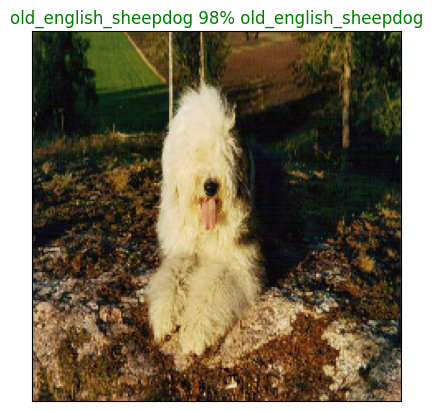

In [ ]:
plot_pred(prediction_probabilities=predictions, labels=val_labels, images=val_images, n=7)

Now we've got one function to visualize our model's top prediction, let's make another to visualize our model's top 10 predictions.

This function will:
* Take an array of prediction probabilities, ground truth array, and an integer.
* Find the prediction using `get_pred_label()`.
* Find the top 10:
    * Prediction probabilities indexes
    * Prediction probabilitiesvalues
    * Prediction labels

* Plot the top 10 prediction probabilities values and labels, and turn the color of true label to green.

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 prediction probabilities confidences along with the truth label of sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  #Get the predicted label
  pred_label = get_pred_label(pred_prob)

  #Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  #FInd the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  #Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  #Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  #Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")


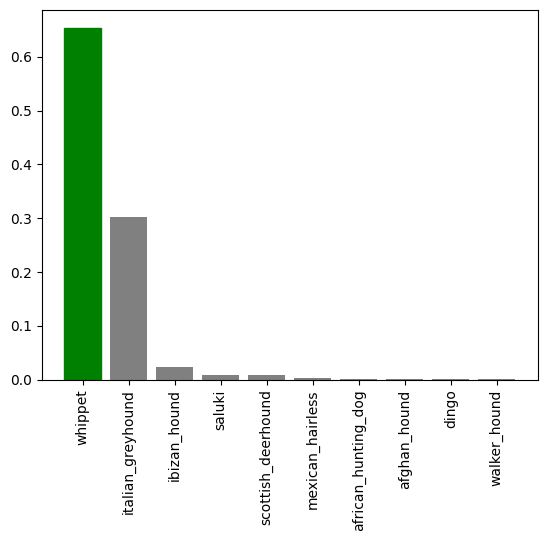

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=13)



Now we've got some functions to help us visualize and evaluate our model, let's try some others.

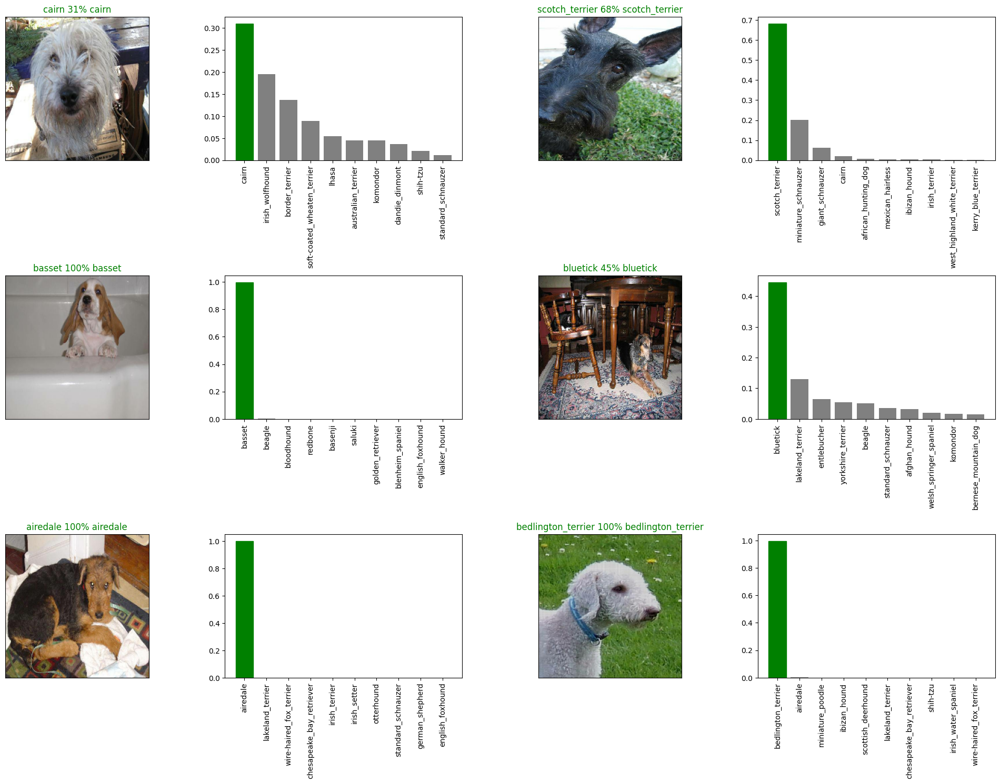

In [ ]:
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))

for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)

plt.tight_layout(h_pad=1.0)
plt.show()

####Question: How to create a confusion matrix to compare our predicted labels with true labels?

## Saving and Loading a Model

In [ ]:
#Creating a function to save a model
def save_model(model, suffix=None):
  """
  Saves a model to the models' directory and appends a suffix (string).
  """

  #Create a model pathname with the current time
  modeldir = os.path.join("drive/My Drive/Colab Notebooks/Dog Project/models",
                          datetime.datetime.now().strftime("%Y-%m-%d-%H%M%s"))

  model_path = modeldir + '-' + suffix + '.h5' #save format of model
  print(f"Saving model to {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
#Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from models' directory.
  """

  print(f"Loading the saved model from {model_path}...")
  model = tf.keras.models.load_model(model_path, custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
#Saving the model
save_model(model, suffix="1000-images-mobilenet-Adam")

Saving model to drive/My Drive/Colab Notebooks/Dog Project/models/2024-07-14-15441720971871-1000-images-mobilenet-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/My Drive/Colab Notebooks/Dog Project/models/2024-07-14-15441720971871-1000-images-mobilenet-Adam.h5'

In [ ]:
#Loading the model
loaded_1000_images_model = load_model('drive/MyDrive/Colab Notebooks/Dog Project/models/2024-07-14-15441720971871-1000-images-mobilenet-Adam.h5')

Loading the saved model from drive/MyDrive/Colab Notebooks/Dog Project/models/2024-07-14-15441720971871-1000-images-mobilenet-Adam.h5...


In [ ]:
loaded_1000_images_model.evaluate(val_data)

7/7 [==============================] - 1s 104ms/step - loss: 1.2557 - Accuracy: 0.7100


[1.2556617259979248, 0.7099999785423279]

###Training a big dog model (on full data)

In [ ]:
#Create a data_batch with full dataset
full_data = create_data_batches(X, y)

Creating training batches...


In [ ]:
#Create a model for full model
full_model = create_model()

Building a model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
#Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()

#No validation set because we're training using the full data, so we can't monitor val-accuracy.
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy", patience=3)

Running the cell below will take approximaately ~30 minutes to 1 hour.


In [ ]:
#Fit the full_model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - ETA: 0s - loss: 1.3213 - Accuracy: 0.6730

320/320 [==============================] - 53s 153ms/step - loss: 1.3213 - Accuracy: 0.6730
Epoch 2/100
319/320 [============================>.] - ETA: 0s - loss: 0.3966 - Accuracy: 0.8796

320/320 [==============================] - 47s 147ms/step - loss: 0.3962 - Accuracy: 0.8798
Epoch 3/100
319/320 [============================>.] - ETA: 0s - loss: 0.2370 - Accuracy: 0.9322

320/320 [==============================] - 47s 146ms/step - loss: 0.2370 - Accuracy: 0.9322
Epoch 4/100
319/320 [============================>.] - ETA: 0s - loss: 0.1533 - Accuracy: 0.9647

320/320 [==============================] - 44s 136ms/step - loss: 0.1531 - Accuracy: 0.9648
Epoch 5/100
319/320 [============================>.] - ETA: 0s - loss: 0.1027 - Accuracy: 0.9812

320/320 [==============================] - 43s 136ms/step - loss: 0.1028 - Accuracy: 0.9811
Epoch 6/100
320/320 [==============================] - ETA: 0s - loss: 0.0754 - Accuracy: 0.9874

320/320 [==============================] - 43s 135ms/step - loss: 0.0754 - Accuracy: 0.9874
Epoch 7/100
320/320 [==============================] - ETA: 0s - loss: 0.0590 - Accuracy: 0.9914

320/320 [==============================] - 45s 142ms/step - loss: 0.0590 - Accuracy: 0.9914
Epoch 8/100
320/320 [==============================] - ETA: 0s - loss: 0.0459 - Accuracy: 0.9947

320/320 [==============================] - 45s 139ms/step - loss: 0.0459 - Accuracy: 0.9947
Epoch 9/100
319/320 [============================>.] - ETA: 0s - loss: 0.0377 - Accuracy: 0.9961

320/320 [==============================] - 42s 132ms/step - loss: 0.0376 - Accuracy: 0.9961
Epoch 10/100
319/320 [============================>.] - ETA: 0s - loss: 0.0298 - Accuracy: 0.9975

320/320 [==============================] - 43s 135ms/step - loss: 0.0302 - Accuracy: 0.9974
Epoch 11/100
319/320 [============================>.] - ETA: 0s - loss: 0.0273 - Accuracy: 0.9976

320/320 [==============================] - 43s 135ms/step - loss: 0.0272 - Accuracy: 0.9976
Epoch 12/100
319/320 [============================>.] - ETA: 0s - loss: 0.0224 - Accuracy: 0.9981

320/320 [==============================] - 44s 137ms/step - loss: 0.0224 - Accuracy: 0.9981
Epoch 13/100
319/320 [============================>.] - ETA: 0s - loss: 0.0213 - Accuracy: 0.9977

320/320 [==============================] - 43s 134ms/step - loss: 0.0213 - Accuracy: 0.9977
Epoch 14/100
319/320 [============================>.] - ETA: 0s - loss: 0.0173 - Accuracy: 0.9986

320/320 [==============================] - 45s 142ms/step - loss: 0.0173 - Accuracy: 0.9986
Epoch 15/100
319/320 [============================>.] - ETA: 0s - loss: 0.0159 - Accuracy: 0.9982

320/320 [==============================] - 44s 137ms/step - loss: 0.0158 - Accuracy: 0.9982
Epoch 16/100
320/320 [==============================] - ETA: 0s - loss: 0.0146 - Accuracy: 0.9983

320/320 [==============================] - 46s 142ms/step - loss: 0.0146 - Accuracy: 0.9983
Epoch 17/100
320/320 [==============================] - ETA: 0s - loss: 0.0124 - Accuracy: 0.9988

320/320 [==============================] - 45s 139ms/step - loss: 0.0124 - Accuracy: 0.9988
Epoch 18/100
320/320 [==============================] - ETA: 0s - loss: 0.0121 - Accuracy: 0.9988

320/320 [==============================] - 45s 141ms/step - loss: 0.0121 - Accuracy: 0.9988
Epoch 19/100
319/320 [============================>.] - ETA: 0s - loss: 0.0108 - Accuracy: 0.9986

320/320 [==============================] - 43s 135ms/step - loss: 0.0108 - Accuracy: 0.9986
Epoch 20/100
319/320 [============================>.] - ETA: 0s - loss: 0.0106 - Accuracy: 0.9988

320/320 [==============================] - 46s 145ms/step - loss: 0.0106 - Accuracy: 0.9988
Epoch 21/100
319/320 [============================>.] - ETA: 0s - loss: 0.0104 - Accuracy: 0.9990

320/320 [==============================] - 43s 136ms/step - loss: 0.0104 - Accuracy: 0.9990
Epoch 22/100
320/320 [==============================] - ETA: 0s - loss: 0.0086 - Accuracy: 0.9991

320/320 [==============================] - 44s 139ms/step - loss: 0.0086 - Accuracy: 0.9991
Epoch 23/100
319/320 [============================>.] - ETA: 0s - loss: 0.0081 - Accuracy: 0.9988

320/320 [==============================] - 45s 140ms/step - loss: 0.0081 - Accuracy: 0.9988
Epoch 24/100
319/320 [============================>.] - ETA: 0s - loss: 0.0077 - Accuracy: 0.9990

320/320 [==============================] - 47s 147ms/step - loss: 0.0077 - Accuracy: 0.9990
Epoch 25/100
319/320 [============================>.] - ETA: 0s - loss: 0.0098 - Accuracy: 0.9988

320/320 [==============================] - 47s 147ms/step - loss: 0.0098 - Accuracy: 0.9988
Epoch 26/100
319/320 [============================>.] - ETA: 0s - loss: 0.0097 - Accuracy: 0.9985

320/320 [==============================] - 44s 138ms/step - loss: 0.0097 - Accuracy: 0.9985
Epoch 27/100
319/320 [============================>.] - ETA: 0s - loss: 0.0147 - Accuracy: 0.9969

320/320 [==============================] - 43s 135ms/step - loss: 0.0147 - Accuracy: 0.9969
Epoch 28/100
319/320 [============================>.] - ETA: 0s - loss: 0.0441 - Accuracy: 0.9874

320/320 [==============================] - 44s 137ms/step - loss: 0.0440 - Accuracy: 0.9874
Epoch 29/100
319/320 [============================>.] - ETA: 0s - loss: 0.0348 - Accuracy: 0.9910

320/320 [==============================] - 43s 133ms/step - loss: 0.0347 - Accuracy: 0.9910
Epoch 30/100
319/320 [============================>.] - ETA: 0s - loss: 0.0103 - Accuracy: 0.9980

320/320 [==============================] - 42s 132ms/step - loss: 0.0103 - Accuracy: 0.9980
Epoch 31/100
320/320 [==============================] - ETA: 0s - loss: 0.0094 - Accuracy: 0.9988

320/320 [==============================] - 42s 132ms/step - loss: 0.0094 - Accuracy: 0.9988
Epoch 32/100
320/320 [==============================] - ETA: 0s - loss: 0.0068 - Accuracy: 0.9989

320/320 [==============================] - 45s 139ms/step - loss: 0.0068 - Accuracy: 0.9989
Epoch 33/100
319/320 [============================>.] - ETA: 0s - loss: 0.0055 - Accuracy: 0.9992

320/320 [==============================] - 44s 138ms/step - loss: 0.0055 - Accuracy: 0.9992
Epoch 34/100
319/320 [============================>.] - ETA: 0s - loss: 0.0067 - Accuracy: 0.9992

320/320 [==============================] - 43s 135ms/step - loss: 0.0067 - Accuracy: 0.9992
Epoch 35/100
319/320 [============================>.] - ETA: 0s - loss: 0.0063 - Accuracy: 0.9993

320/320 [==============================] - 43s 133ms/step - loss: 0.0063 - Accuracy: 0.9993
Epoch 36/100
319/320 [============================>.] - ETA: 0s - loss: 0.0074 - Accuracy: 0.9989

320/320 [==============================] - 44s 137ms/step - loss: 0.0074 - Accuracy: 0.9989
Epoch 37/100
319/320 [============================>.] - ETA: 0s - loss: 0.0076 - Accuracy: 0.9989

320/320 [==============================] - 44s 137ms/step - loss: 0.0076 - Accuracy: 0.9989
Epoch 38/100
319/320 [============================>.] - ETA: 0s - loss: 0.0046 - Accuracy: 0.9994

320/320 [==============================] - 45s 139ms/step - loss: 0.0046 - Accuracy: 0.9994
Epoch 39/100
319/320 [============================>.] - ETA: 0s - loss: 0.0085 - Accuracy: 0.9989

320/320 [==============================] - 44s 137ms/step - loss: 0.0085 - Accuracy: 0.9989
Epoch 40/100
320/320 [==============================] - ETA: 0s - loss: 0.0088 - Accuracy: 0.9988

320/320 [==============================] - 43s 133ms/step - loss: 0.0088 - Accuracy: 0.9988
Epoch 41/100
320/320 [==============================] - ETA: 0s - loss: 0.0084 - Accuracy: 0.9989

320/320 [==============================] - 41s 129ms/step - loss: 0.0084 - Accuracy: 0.9989
Epoch 42/100
320/320 [==============================] - ETA: 0s - loss: 0.0076 - Accuracy: 0.9990

320/320 [==============================] - 43s 136ms/step - loss: 0.0076 - Accuracy: 0.9990
Epoch 43/100
319/320 [============================>.] - ETA: 0s - loss: 0.0065 - Accuracy: 0.9991

320/320 [==============================] - 43s 134ms/step - loss: 0.0072 - Accuracy: 0.9990
Epoch 44/100
319/320 [============================>.] - ETA: 0s - loss: 0.0062 - Accuracy: 0.9991

320/320 [==============================] - 43s 134ms/step - loss: 0.0062 - Accuracy: 0.9991
Epoch 45/100
319/320 [============================>.] - ETA: 0s - loss: 0.0073 - Accuracy: 0.9989

320/320 [==============================] - 43s 136ms/step - loss: 0.0073 - Accuracy: 0.9989
Epoch 46/100
319/320 [============================>.] - ETA: 0s - loss: 0.0102 - Accuracy: 0.9979

320/320 [==============================] - 45s 140ms/step - loss: 0.0102 - Accuracy: 0.9979
Epoch 47/100
319/320 [============================>.] - ETA: 0s - loss: 0.0082 - Accuracy: 0.9985

320/320 [==============================] - 44s 137ms/step - loss: 0.0082 - Accuracy: 0.9985
Epoch 48/100
319/320 [============================>.] - ETA: 0s - loss: 0.0100 - Accuracy: 0.9977

320/320 [==============================] - 44s 138ms/step - loss: 0.0100 - Accuracy: 0.9977
Epoch 49/100
319/320 [============================>.] - ETA: 0s - loss: 0.0136 - Accuracy: 0.9968

320/320 [==============================] - 44s 138ms/step - loss: 0.0136 - Accuracy: 0.9968
Epoch 50/100
319/320 [============================>.] - ETA: 0s - loss: 0.0079 - Accuracy: 0.9986

320/320 [==============================] - 45s 140ms/step - loss: 0.0078 - Accuracy: 0.9986
Epoch 51/100
319/320 [============================>.] - ETA: 0s - loss: 0.0077 - Accuracy: 0.9989

320/320 [==============================] - 44s 138ms/step - loss: 0.0077 - Accuracy: 0.9989
Epoch 52/100
320/320 [==============================] - ETA: 0s - loss: 0.0092 - Accuracy: 0.9988

320/320 [==============================] - 42s 130ms/step - loss: 0.0092 - Accuracy: 0.9988
Epoch 53/100
320/320 [==============================] - ETA: 0s - loss: 0.0072 - Accuracy: 0.9991

320/320 [==============================] - 44s 137ms/step - loss: 0.0072 - Accuracy: 0.9991
Epoch 54/100
319/320 [============================>.] - ETA: 0s - loss: 0.0067 - Accuracy: 0.9991

320/320 [==============================] - 45s 139ms/step - loss: 0.0067 - Accuracy: 0.9991
Epoch 55/100
320/320 [==============================] - ETA: 0s - loss: 0.0059 - Accuracy: 0.9993

320/320 [==============================] - 47s 148ms/step - loss: 0.0059 - Accuracy: 0.9993
Epoch 56/100
319/320 [============================>.] - ETA: 0s - loss: 0.0087 - Accuracy: 0.9989

320/320 [==============================] - 47s 147ms/step - loss: 0.0087 - Accuracy: 0.9989
Epoch 57/100
320/320 [==============================] - ETA: 0s - loss: 0.0077 - Accuracy: 0.9989

320/320 [==============================] - 46s 145ms/step - loss: 0.0077 - Accuracy: 0.9989
Epoch 58/100
320/320 [==============================] - ETA: 0s - loss: 0.0053 - Accuracy: 0.9993

320/320 [==============================] - 48s 149ms/step - loss: 0.0053 - Accuracy: 0.9993
Epoch 59/100
319/320 [============================>.] - ETA: 0s - loss: 0.0061 - Accuracy: 0.9992

320/320 [==============================] - 47s 146ms/step - loss: 0.0061 - Accuracy: 0.9992
Epoch 60/100
319/320 [============================>.] - ETA: 0s - loss: 0.0067 - Accuracy: 0.9991

320/320 [==============================] - 46s 142ms/step - loss: 0.0067 - Accuracy: 0.9991
Epoch 61/100
320/320 [==============================] - ETA: 0s - loss: 0.0070 - Accuracy: 0.9991

320/320 [==============================] - 46s 142ms/step - loss: 0.0070 - Accuracy: 0.9991
Epoch 62/100
319/320 [============================>.] - ETA: 0s - loss: 0.0067 - Accuracy: 0.9991

320/320 [==============================] - 43s 133ms/step - loss: 0.0067 - Accuracy: 0.9991
Epoch 63/100
320/320 [==============================] - ETA: 0s - loss: 0.0085 - Accuracy: 0.9989

320/320 [==============================] - 44s 136ms/step - loss: 0.0085 - Accuracy: 0.9989
Epoch 64/100
320/320 [==============================] - ETA: 0s - loss: 0.0065 - Accuracy: 0.9992

320/320 [==============================] - 45s 141ms/step - loss: 0.0065 - Accuracy: 0.9992
Epoch 65/100
319/320 [============================>.] - ETA: 0s - loss: 0.0074 - Accuracy: 0.9989

320/320 [==============================] - 44s 139ms/step - loss: 0.0074 - Accuracy: 0.9989
Epoch 66/100
319/320 [============================>.] - ETA: 0s - loss: 0.0065 - Accuracy: 0.9990

320/320 [==============================] - 44s 137ms/step - loss: 0.0064 - Accuracy: 0.9990
Epoch 67/100
319/320 [============================>.] - ETA: 0s - loss: 0.0067 - Accuracy: 0.9991

320/320 [==============================] - 44s 137ms/step - loss: 0.0067 - Accuracy: 0.9991
Epoch 68/100
320/320 [==============================] - ETA: 0s - loss: 0.0070 - Accuracy: 0.9990

320/320 [==============================] - 44s 137ms/step - loss: 0.0070 - Accuracy: 0.9990
Epoch 69/100
320/320 [==============================] - ETA: 0s - loss: 0.0053 - Accuracy: 0.9993

320/320 [==============================] - 45s 141ms/step - loss: 0.0053 - Accuracy: 0.9993
Epoch 70/100
319/320 [============================>.] - ETA: 0s - loss: 0.0082 - Accuracy: 0.9990

320/320 [==============================] - 44s 139ms/step - loss: 0.0082 - Accuracy: 0.9990
Epoch 71/100
319/320 [============================>.] - ETA: 0s - loss: 0.0086 - Accuracy: 0.9988

320/320 [==============================] - 43s 133ms/step - loss: 0.0086 - Accuracy: 0.9988


In [ ]:
#Save the full_model
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

NameError: name 'save_model' is not defined

In [ ]:
#Load the saved full model
loaded_full_model = load_model("")

###Making predictions on the test dataset

Since our training data has been trained in the form of Tensor batches, to make predictions on test data, it should be in the same format.

Using `create_data_batches()` we can input a list of filenames and convert them to Tensor batches.

To make predictions on the test data, we have to:
* Get the test image filenames.
* Convert the filenames into test data batches using `create_data_baches()` and setting the test parameter to True (because test data has no labels).
* Make a prediction array by passing the test baches to the `predict()` function.




In [ ]:
#Load the image filenames
test_path = "drive/My Drive/Colab Notebooks/Dog Project/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

In [ ]:
#Creating the test data batch
test_data = create_data_batches(test_filenames, test_data=True)

####Note:
Calling `predict()` on the full test data set will take an approx ~1hr. That's because the model has to go through 10.4k images to find patterns and predict.

In [ ]:
#Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data, verbose=1)

In [ ]:
#Save predictions (numpy array) to csv file (for later use)
np.savetxt("drive/My Drive/Colab Notebooks/Dog Project/preds-array.csv", test_predictions, delimiter=",")

###Preparing the test dataset predictions for submission to Kaggle

Looking at the Kaggle sample submission, we find that it wants our model's predictions probabalities output in a DataFrame with ID and a column for each of our dog breeds.

To get the data in this format, we'll:
* Create a pandas DataFrame with ID column and a column for each of our dog breeds.
* Add data to the ID column by extracting the test image ID's from filepaths.
* Add data (the prediction probabilities) to each of the dog breed columns.
* Export the DataFrame as csv to submit to Kaggle.

In [ ]:
# ["id"] + list(unique_breeds)

In [ ]:
#Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

In [ ]:
#Append test image ID's to pandas DataFrame ID column
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids
preds_df.head()

In [ ]:
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

In [ ]:
#Saving the DataFrame to csv to submit to Kaggle
preds_df.to_csv("drive/My Drive/Colab Notebooks/Dog Project/dog-vision-project-submission.csv", index=False)

###Making predictions on custom images

To make predictions on custom images, we have to:
1. Get the filepaths of our own images.
2. Turn the file paths into data baches using `create_data_batches()`. And since our file paths won't have labels, we will set the `test_data` parameter to true.
3. Pass the custom image data batch to our model's `predict()` method.
4. Convert the prediction output probabilities into prediction labels.
5. Compare the predicted labels with custom images.

In [ ]:
#Get custom image filepaths
custom_path = "drive/My Drive/Colab Notebooks/Dog Project/my-dog-photos"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
#Turn custom images to data batches
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

In [ ]:
#Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)
custom_preds

In [ ]:
#Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]

In [ ]:
#Get custom images (our batchify() function won't work because there aren't any labels). A improvement we can add later.
custom_images = []
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append[image]

In [ ]:
#Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)